In [21]:
from dataclasses import dataclass
from typing import List

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

import matplotlib as mpl
mpl.rcParams['figure.dpi'] = 300


In [22]:
wind_data = pd.read_csv("wind_data.csv.gz")
wind_data

,DATE (MM/DD/YYYY),MST,Direct Normal [W/m^2],Avg Wind Speed @ 2m [m/s],Avg Wind Speed @ 5m [m/s],Avg Wind Speed @ 10m [m/s],Avg Wind Speed @ 20m [m/s],Avg Wind Speed @ 50m [m/s],Avg Wind Speed @ 80m [m/s],Avg Wind Direction @ 80m [deg]
0,1/1/2002,00:00,-99999.00000,2.0394,2.3580,2.7312,2.8151,4.1876,4.1892,32.418
1,1/1/2002,00:01,-99999.00000,2.3720,2.6570,2.7907,2.8560,4.0661,4.3228,31.619
2,1/1/2002,00:02,-99999.00000,2.8346,3.3486,3.5522,2.9207,4.2418,4.1098,31.615
3,1/1/2002,00:03,-99999.00000,2.6098,2.9824,3.4231,2.8354,3.5784,3.6317,32.494
4,1/1/2002,00:04,-99999.00000,2.9823,3.2205,3.5745,2.8801,3.7960,3.8350,31.677
...,...,...,...,...,...,...,...,...,...,...
10562422,1/11/2022,23:55,-1.32498,1.1410,1.1900,1.5690,1.9180,3.5030,4.7550,324.100
10562423,1/11/2022,23:56,-1.35014,1.0890,1.3170,1.7190,1.6190,3.0610,4.4580,340.800
10562424,1/11/2022,23:57,-1.37809,1.3320,1.3470,1.5670,1.6080,3.9280,4.0260,335.300
10562425,1/11/2022,23:58,-1.30541,1.3170,1.2470,1.3380,0.8910,3.1650,3.7430,337.200


In [23]:
raw_np_data = wind_data.to_numpy()
# raw_np_data = raw_np_data[0:1000000]
raw_np_data

array([['1/1/2002', '00:00', -99999.0, ..., 4.1876, 4.1892, 32.418],
       ['1/1/2002', '00:01', -99999.0, ..., 4.0661, 4.3228, 31.619],
       ['1/1/2002', '00:02', -99999.0, ..., 4.2418, 4.1098, 31.615],
       ...,
       ['1/11/2022', '23:57', -1.37809, ..., 3.928, 4.026, 335.3],
       ['1/11/2022', '23:58', -1.30541, ..., 3.165, 3.743, 337.2],
       ['1/11/2022', '23:59', -1.16844, ..., 2.909, 3.943, 345.8]],
      dtype=object)

In [24]:
# add two columns so we can expand the date from m/d/y into m, d, y. Also, convert the time from hh:mm into h * 60 + m
# after this, the columns in the numpy data will be:
# 0 month
# 1 day
# 2 year
# 3 minute of day
# 4 Direct Normal [W/m^2],
# 5 Avg Wind Speed @ 2m [m/s],
# 6 Avg Wind Speed @ 5m [m/s]
# 7 Avg Wind Speed @ 10m [m/s]
# 8 Avg Wind Speed @ 20m [m/s]
# 9 Avg Wind Speed @ 50m [m/s]
# 10 Avg Wind Speed @ 80m [m/s]
# 11 Avg Wind Direction @ 80m

adjusted_data = np.zeros([raw_np_data.shape[0], raw_np_data.shape[1] + 2])
for r in range(raw_np_data.shape[0]):
    mdy = raw_np_data[r, 0].split("/")
    adjusted_data[r, 0:3] = mdy
    hm = raw_np_data[r, 1].split(":")
    adjusted_data[r, 3] = int(hm[0]) * 60 + int(hm[1])
    adjusted_data[r, 4:] = raw_np_data[r, 2:]

adjusted_data

array([[1.0000e+00, 1.0000e+00, 2.0020e+03, ..., 4.1876e+00, 4.1892e+00,
        3.2418e+01],
       [1.0000e+00, 1.0000e+00, 2.0020e+03, ..., 4.0661e+00, 4.3228e+00,
        3.1619e+01],
       [1.0000e+00, 1.0000e+00, 2.0020e+03, ..., 4.2418e+00, 4.1098e+00,
        3.1615e+01],
       ...,
       [1.0000e+00, 1.1000e+01, 2.0220e+03, ..., 3.9280e+00, 4.0260e+00,
        3.3530e+02],
       [1.0000e+00, 1.1000e+01, 2.0220e+03, ..., 3.1650e+00, 3.7430e+00,
        3.3720e+02],
       [1.0000e+00, 1.1000e+01, 2.0220e+03, ..., 2.9090e+00, 3.9430e+00,
        3.4580e+02]])

In [25]:
@dataclass
class PlotInfo:
    data: List[np.ndarray]
    title: str
    labels: List[str]
    yRange: List[float]
    line_width: float



In [26]:
def rolling_average(data: np.ndarray, window_size: int):
    smooth_data = np.zeros(data.shape)
    for i in range(data.shape[0]):
        start = max(0, i - window_size)
        end = min(data.shape[0], i + window_size)
        smooth_data[i] = np.mean(data[start: end])
    return smooth_data

In [27]:
def slice_by_minute(wind_speed_data: np.ndarray, column: int):
    sliced_data = [[] for i in range(24 * 60)]

    for r in range(wind_speed_data.shape[0]):
        minute_of_day = int(wind_speed_data[r, 3])
        wind_speed = wind_speed_data[r, column]
        if wind_speed > 0:
            sliced_data[minute_of_day].append(wind_speed)

    mean_values = np.zeros([24 * 60])
    for r in range(len(sliced_data)):
        mean_values[r] = np.mean(sliced_data[r])
    return rolling_average(mean_values, 10)

def pct_by_minute(wind_speed_data: np.ndarray, c1: int, c2: int):
    sliced_data = [[] for i in range(24 * 60)]

    for r in range(wind_speed_data.shape[0]):
        minute_of_day = int(wind_speed_data[r, 3])
        v1 = wind_speed_data[r, c1]
        v2 = wind_speed_data[r, c2]
        if v1 > 0 and v2 > 0:
            wind_speed = v1 / v2
            sliced_data[minute_of_day].append(wind_speed)

    mean_values = np.zeros([24 * 60])
    for r in range(len(sliced_data)):
        mean_values[r] = np.mean(sliced_data[r])
    return rolling_average(mean_values, 10)



In [28]:
def make_plot_info(wind_speed_data: np.ndarray, title: str) -> PlotInfo:
    labels = ["2 meters", "5 meters", "10 meters", "20 meters", "50 meters", "80 meters", ]
    mws = [slice_by_minute(wind_speed_data, column) for column in [5, 6, 7, 8, 9, 10]]
    return PlotInfo(mws, title, labels=labels, yRange=[0, 10], line_width=2)


In [29]:
month_names = ["January", "February", "March", "April", "May", "June", "July", "August", "September", "October",
               "November",
               "December", ]


def filter_by_month(data: np.ndarray, month: int):
    return data[data[:, 0] == month + 1]


def filter_by_wind_direction(data: np.ndarray, start_direction: float, end_direction: float):
    wind_direction = data[:, 11]
    mm = [start_direction <= d < end_direction for d in wind_direction]
    return data[mm]

In [30]:
plot_info_by_month = []
for m in range(12):
    wsd = filter_by_month(adjusted_data, m)
    # print(f"filtered by month.shape {wsd.shape}")
    pi = make_plot_info(wsd, f"{month_names[m]}")
    plot_info_by_month.append(pi)

In [31]:
plot_info_by_direction = []
n_directions = 8
step = 360 / n_directions
for d in range(8):
    start = d * step
    end = d * step + step
    wsd = filter_by_wind_direction(adjusted_data, start, end)
    pi = make_plot_info(wsd, f"{start} to {end}")
    plot_info_by_direction.append(pi)

In [32]:
def make_line_plot(plotInfo: List[PlotInfo], title: str,
                   n_rows: int, n_cols: int,
                   xlabel: str = "Minute of Day",
                   ylabel: str = "Wind Speed",
                   title_font_size: int = 22,
                   graph_title_font_size: int = 18,
                   axis_label_font_size: int = 20,
                   figsize: [int] = [20, 20]):
    fig, axes = plt.subplots(nrows=n_rows, ncols=n_cols, figsize=figsize)
    fig.suptitle(title, color="black", fontsize=title_font_size)
    fig.set_facecolor("white")
    fig.tight_layout(pad=5.0)

    for i in range(len(plotInfo)):
        row = i // n_cols
        col = i % n_cols
        if n_rows == 1 and n_cols == 1:
            a = axes
        else:
            a = axes[row][col]

        a.set_title(plotInfo[i].title, fontsize=graph_title_font_size)
        a.set_ylabel(ylabel, fontsize=axis_label_font_size)
        a.set_xlabel(xlabel, fontsize=axis_label_font_size)
        a.tick_params(axis='x', labelsize=axis_label_font_size)
        a.tick_params(axis='y', labelsize=axis_label_font_size)
        for j in range(len(plotInfo[i].data)):
            pi = plotInfo[i]
            nSamples = pi.data[j].shape[0]
            a.plot(range(nSamples), pi.data[j], label=pi.labels[j], linewidth=pi.line_width)
            a.legend(fontsize=axis_label_font_size)

solar radiation first date:  [6.000e+00 1.000e+00 2.021e+03] min_value 50.005
solar radiation last  date:  [  12.   30. 2021.]


<Figure size 1800x1200 with 0 Axes>

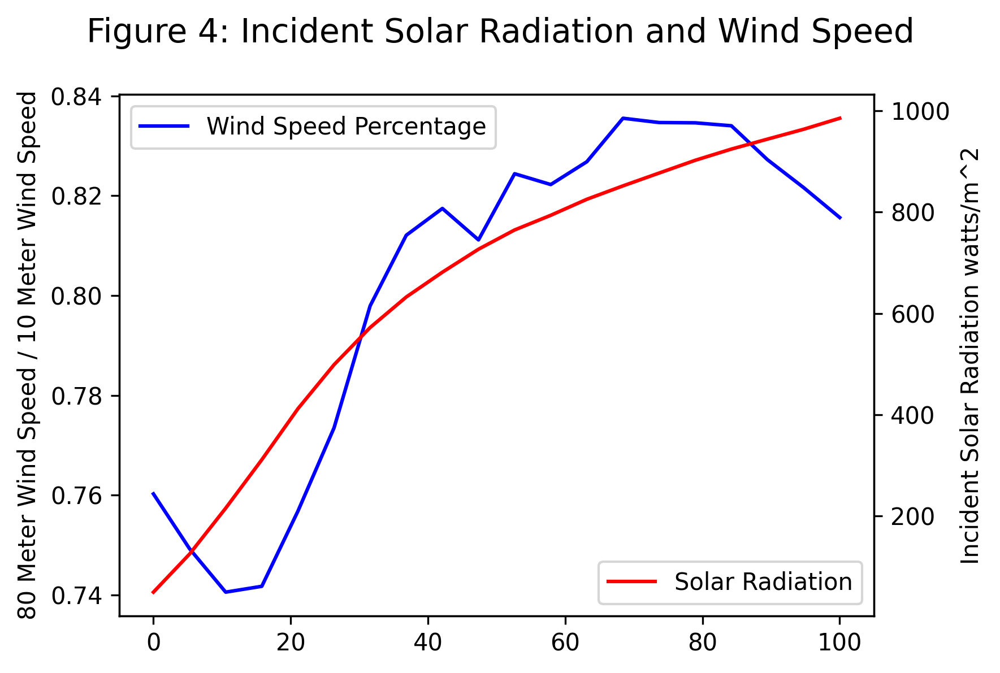

In [33]:
def slice_by_solar(wind_speed_data: np.ndarray, c1: int, c2: int):
    filtered_data = wind_speed_data[wind_speed_data[:,4] > 50]
    print(f"solar radiation first date:  {filtered_data[0,0:3]} min_value {np.min(filtered_data[:,4])}")
    print(f"solar radiation last  date:  {filtered_data[-1,0:3]}")
    sorted_data = filtered_data[filtered_data[:, 3].argsort()]
    sorted_data = sorted_data[sorted_data[:, 4].argsort()]
    rows = sorted_data.shape[0]

    bins = 20
    chunk = int(rows // bins)
    sliced_data = np.zeros([bins])

    idx = [i for i in range(0, rows, chunk)]
    ir_values = sorted_data[idx,4]

    for b in range(bins):
        start = b * chunk
        end = start + chunk
        c1m = np.mean(sorted_data[start: end, c1])
        c2m = np.mean(sorted_data[start: end, c2])
        sliced_data[b] = c1m / c2m
    return sliced_data, ir_values, sorted_data

def plot_solar_effect(wind_speed_data: np.ndarray, title: str = ""):
    solar_data, ir_values, sorted_data = slice_by_solar(wind_speed_data, 7, 10)
    rows = solar_data.shape[0]
    ir_values = ir_values[0:rows]
    plt.tight_layout(pad=1.5)


    fig = plt.figure()
    fig.suptitle(f"Figure 4: Incident Solar Radiation and Wind Speed", color="black", fontsize=14)
    fig.set_facecolor("white")

    ax = plt.axes()
    ax2 = ax.twinx()
    x = np.linspace(0, 100, solar_data.shape[0])
    ax.plot(x,solar_data, color="blue", label="Wind Speed Percentage")
    ax.set_ylabel("80 Meter Wind Speed / 10 Meter Wind Speed")
    ax2.plot(x, ir_values, color="red", label="Solar Radiation")
    ax2.set_ylabel("Incident Solar Radiation watts/m^2")
    ax.set_facecolor("white")
    ax2.set_facecolor("white")
    ax.legend(fontsize=10)
    ax2.legend(fontsize=10, loc="lower right")
    fig.tight_layout(w_pad = 5)
    plt.savefig("solarEffect.png")


plot_solar_effect(adjusted_data, "")

# this would plot the solar effect for each hour of the day.
# for h in range(0, 24):
#     dd = adjusted_data[adjusted_data[:, 3] // 60 == h]
#     print(f"adjusted_data.shape[0] {adjusted_data.shape[0]} dd.shape[0] {dd.shape[0]}")
#     plot_solar_effect(dd, f"{h} -> {h + 1}")

In [34]:
a,b,sorted_data = slice_by_solar( adjusted_data, 7, 10)
x = adjusted_data[0:100]

solar radiation first date:  [6.000e+00 1.000e+00 2.021e+03] min_value 50.005
solar radiation last  date:  [  12.   30. 2021.]


In [35]:
make_line_plot(plot_info_by_direction,
               "Figure 0: Wind Speed by Direction",
               4,
               2,
               "Minute of Day",
               "Wind Speed",
               title_font_size=40,
               graph_title_font_size=18,
               axis_label_font_size=16,
               figsize=[30, 20]
               )
plt.savefig("wind_by_direction.png")

In [36]:
make_line_plot(plot_info_by_month,
               "Figure 2: Wind Speed By Month",
               3, 4,
               "Minute of Day",
               "Wind Speed (m/s)",
               title_font_size=40,
               graph_title_font_size=18,
               axis_label_font_size=16,
               figsize=[30, 30]
               )

plt.savefig("wind_by_month.png")

In [37]:
def get_boundary_magnitude(wind_speed_data: np.ndarray):
    speed_at_low = slice_by_minute(wind_speed_data, 7)
    speed_at_high = slice_by_minute(wind_speed_data, 10)
    boundary_effect = speed_at_low - speed_at_high
    return boundary_effect



def filter_by_month_group(wind_speed_data: np.ndarray, month_group: List[int]):
    mm = [filter_by_month(wind_speed_data, m) for m in month_group]
    return np.vstack(mm)


def plot_boundary_effects_by_month(wind_speed_data: np.ndarray):
    g1 = [10, 11, 0, 1]
    g2 = [2, 3, 9]
    g3 = [4, 5, 6, 7, 8]
    month_groups = [g1, g2, g3]

    boundary_effects = []
    for month_group in month_groups:
        filtered_data = filter_by_month_group(wind_speed_data, month_group)
        # boundary_effect = pct_by_minute(filtered_data, 7, 10)
        v7 = slice_by_minute(filtered_data, 7)
        v10 = slice_by_minute(filtered_data, 10)
        boundary_effect = v7 / v10
        boundary_effects.append(boundary_effect)

    group_labels = [', '.join([month_names[month] for month in group]) for group in month_groups]

    plot_info = PlotInfo(boundary_effects, "Wind speed at 10 meters / speed at 80 meters", group_labels, [.25, 1.75], 5)
    make_line_plot([plot_info], "Figure 3: Daytime Heating Impact by Season", 1, 1,
                   "Minute of Day",
                   "Wind Speed at 10m / speed 80m",
                   title_font_size=50,
                   graph_title_font_size=40,
                   axis_label_font_size=30,
                   figsize=[30, 20])

    # delta = boundary_effects[0] - boundary_effects[2]
    # print(f"shape {boundary_effects[0].shape} {boundary_effects[2].shape} delta.shape {delta.shape}")
    # print(np.max(delta))
    #
    # delta_plot_info = PlotInfo([delta], "Boundary Layer Delta between coldest and warmest months", ["delta"], [0, .6],
    #                            5)
    # make_line_plot([delta_plot_info], "Delta in energy loss from coldest to warmest", 1, 1,
    #                "Minute of Day",
    #                "Difference in Boundary Layer Effect Between Warm Months and Cold Months",
    #                title_font_size=40,
    #                graph_title_font_size=30,
    #                axis_label_font_size=20,
    #                figsize=[30, 20])
    #
    # print("foo")


plot_boundary_effects_by_month(adjusted_data)
plt.savefig("boundary_layer_effect.png")